In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from Data import get_format_data
from Data import get_format_data_without_na, get_rolling_average_data
from Data import get_normalize_data, normalize_data_additive, get_data_norm_flagged, get_gene_data, get_data_norm_flagged_2
import Data
from Data_analysis_func import plot_y2, plot_fv_fm_y2_linear_fit, variance_per_light_regime_y2, variance_per_plate_and_light_regime_y2, get_sample_fv_fm, range_per_plate_and_light_regime_y2
import Data_analysis_func
from Model_checks import plot_y2_distribution, plot_y2_normalized_distribution, normal_test, independence_test, same_variance_test, plot_cov, test_multivariate_gaussian, plot_mean_var_per_light_regime, plot_corr_per_light_regime, plot_distance_matrix
import Model_checks
import seaborn as sns
from Outlier_detection import mean_cov_y2_WT, compute_euclidian_distances, set_euclidian_distances_and_sigma, set_pvalues, set_euclidian_norm, set_log_likelihood_norm, set_sigma_norm, detect_outliers_log_likelihood, set_sigma_gene, detect_outliers_median, set_median_dev
from Genes_self_similarity import plot_genes_self_similarity, get_variance_for_genes, get_mean_var_WT, get_mean_intra_distance_for_genes, apply_flagging, calculate_distances_var, apply_flagging_2
from scipy.stats import multivariate_normal
from sklearn.linear_model import LinearRegression
import Outlier_detection_v2
import Outlier_detection

/Users/samsongourevitch/Documents/Chlamy_Project/venv/lib/python3.7/site-packages/outdated/utils.py:18: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs


## Checking that the model is correct

In [3]:
data = get_format_data_without_na()
data_norm = normalize_data_additive(data)
data_norm_flagged = get_data_norm_flagged(data_norm, 2/3)
data_norm_ok = data_norm_flagged[data_norm_flagged['flag'] == 'ok']

In [4]:
data_WT_99 = data[(data['mutant_ID'] == 'WT') & (data['plate'] == 99)]

In [5]:
data_ML = data[data['light_regime'] == '20h_ML']
data_norm_ML = data_norm[data_norm['light_regime'] == '20h_ML']

In [6]:
# data_ML_WT_99 = data_WT_99[data_WT_99['light_regime'] == '20h_ML']
data_norm_ML_WT_99 = data_norm_ML[(data_norm_ML['mutant_ID'] == 'WT') & (data_norm_ML['plate'] == 99)]
data_norm_ML_WT = data_norm_ML[data_norm_ML['mutant_ID'] == 'WT']

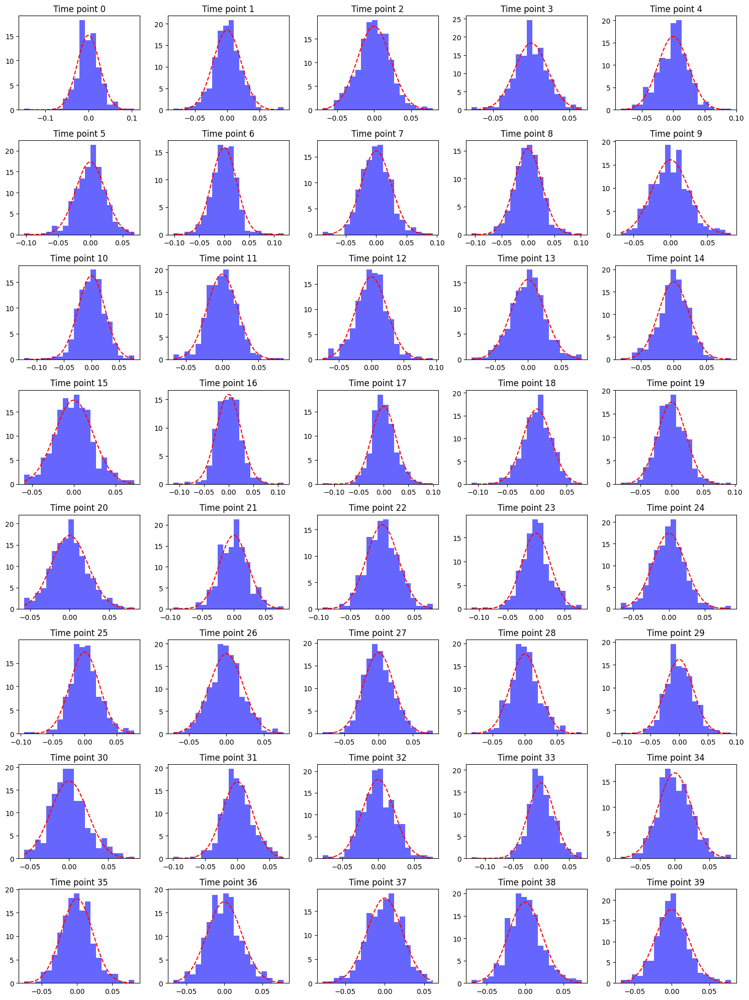

In [8]:
plot_y2_normalized_distribution(data_norm_ML_WT_99)

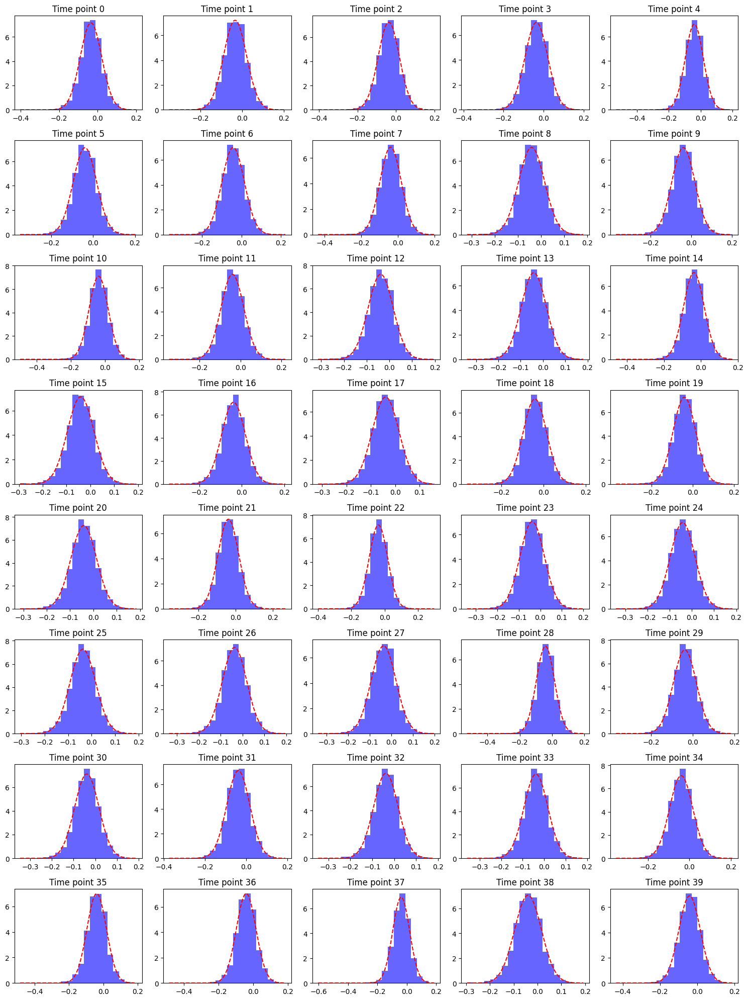

In [ ]:
plot_y2_normalized_distribution(data_norm_ML)

In [12]:
norm_test = normal_test(data_norm_ML_WT_99)

In [13]:
norm_test

,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,...,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40
statistic,0.048105,0.036798,0.029056,0.043210,0.050681,0.044752,0.046524,0.034123,0.031314,0.029292,...,0.055121,0.042248,0.042556,0.052868,0.046058,0.032784,0.047706,0.030638,0.048386,0.040653
p-value,0.327630,0.663463,0.893349,0.459233,0.269662,0.414895,0.367154,0.750596,0.835192,0.887814,...,0.187871,0.488112,0.478761,0.226579,0.379365,0.792206,0.337343,0.853738,0.320927,0.537723


In [14]:
norm_test.T['p-value'].mean()

0.5920977246974513

In [15]:
multi_normal = test_multivariate_gaussian(data_norm_ML_WT_99)

Mardia test statistic: 1.0000609846487878
P-value: 0.0
Is the data multivariate Gaussian? No


In [ ]:
indep_test = independence_test(data_norm_ML_WT_99)

In [ ]:
indep_test

,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40
y2_1,NaN,0.516502,0.588389,0.47889,0.437474,0.466579,0.504682,0.569127,0.45165,0.508441,0.502544,0.400335,0.492481,0.454112,0.539753,0.5013,0.496818,0.513293,0.50981,0.552489,0.505112,0.574669,0.517701,0.540917,0.534142,0.462047,0.517553,0.493568,0.533703,0.408056,0.497906,0.525675,0.411395,0.549393,0.510819,0.468333,0.472658,0.473068,0.431924,0.550799
y2_2,0.516502,NaN,0.520962,0.395055,0.513092,0.531683,0.555534,0.443701,0.567996,0.467838,0.509074,0.559901,0.506276,0.562962,0.588481,0.543296,0.506525,0.485036,0.541866,0.471435,0.52299,0.39356,0.530777,0.494006,0.500764,0.591927,0.518652,0.481211,0.50536,0.422697,0.467191,0.531065,0.550089,0.461029,0.54259,0.49126,0.44987,0.51031,0.438496,0.465781
y2_3,0.588389,0.520962,NaN,0.474615,0.471104,0.477773,0.500093,0.550229,0.489993,0.442984,0.448786,0.441275,0.449774,0.466166,0.498318,0.435403,0.452431,0.521596,0.446843,0.483596,0.487313,0.535023,0.457619,0.407884,0.449996,0.511979,0.491553,0.462936,0.504458,0.411725,0.458182,0.423559,0.436296,0.429254,0.460412,0.454051,0.477903,0.468421,0.418008,0.492074
y2_4,0.47889,0.395055,0.474615,NaN,0.463586,0.414661,0.479125,0.433716,0.421484,0.535137,0.373149,0.319729,0.39825,0.445599,0.456049,0.470285,0.503969,0.411036,0.36138,0.466209,0.493248,0.506067,0.400773,0.375205,0.465525,0.449249,0.429777,0.428209,0.49341,0.426079,0.383994,0.492417,0.3907,0.413926,0.486728,0.371693,0.424217,0.44546,0.46333,0.475877
y2_5,0.437474,0.513092,0.471104,0.463586,NaN,0.421997,0.491729,0.47438,0.544436,0.417368,0.424949,0.442883,0.448867,0.501222,0.473443,0.485386,0.487473,0.416051,0.473648,0.414516,0.470447,0.409963,0.495086,0.414998,0.436477,0.4761,0.413652,0.452106,0.466623,0.41121,0.438132,0.438692,0.347227,0.364836,0.465431,0.410986,0.424898,0.466074,0.469244,0.432552
y2_6,0.466579,0.531683,0.477773,0.414661,0.421997,NaN,0.531626,0.510475,0.513542,0.485069,0.466148,0.484976,0.409572,0.471532,0.51582,0.486988,0.472911,0.419186,0.498416,0.476476,0.502415,0.501095,0.48875,0.469612,0.418565,0.49504,0.46728,0.51612,0.504087,0.409562,0.539368,0.487851,0.484551,0.489324,0.491251,0.469368,0.411996,0.509349,0.409689,0.477476
y2_7,0.504682,0.555534,0.500093,0.479125,0.491729,0.531626,NaN,0.501229,0.538301,0.517367,0.441522,0.490043,0.495616,0.494502,0.553389,0.538426,0.528478,0.444412,0.421178,0.481058,0.513779,0.448605,0.523471,0.469703,0.501333,0.539153,0.511136,0.440527,0.569403,0.432168,0.50199,0.536957,0.499581,0.463693,0.503792,0.46643,0.461802,0.470015,0.466083,0.449455
y2_8,0.569127,0.443701,0.550229,0.433716,0.47438,0.510475,0.501229,NaN,0.457567,0.497637,0.422305,0.370585,0.431469,0.41557,0.502578,0.455704,0.471757,0.469519,0.362132,0.492301,0.41694,0.524,0.509287,0.45322,0.468458,0.496365,0.477315,0.48532,0.48634,0.397971,0.464797,0.491356,0.390431,0.486098,0.435732,0.452113,0.433049,0.435044,0.414373,0.487672
y2_9,0.45165,0.567996,0.489993,0.421484,0.544436,0.513542,0.538301,0.457567,NaN,0.478824,0.513846,0.513155,0.512994,0.516559,0.48232,0.499655,0.496446,0.444167,0.479638,0.474201,0.507693,0.38019,0.491627,0.455713,0.472669,0.550174,0.485056,0.543444,0.585466,0.487233,0.47399,0.546972,0.454593,0.412939,0.519772,0.483665,0.537865,0.509591,0.478186,0.489246
y2_10,0.508441,0.467838,0.442984,0.535137,0.417368,0.485069,0.517367,0.497637,0.478824,NaN,0.437351,0.374226,0.497811,0.422641,0.479277,0.504178,0.539325,0.416614,0.487701,0.52077,0.518936,0.495927,0.482031,0.417864,0.498243,0.475394,0.445329,0.413138,0.587668,0.48413,0.466881,0.528559,0.447559,0.467694,0.532513,0.423784,0.485219,0.468516,0.528244,0.532516


In [17]:
same_variance_test(data_norm_ML_WT_99)

Levene test statistic: 1.676800062943575
P-value: 0.005166880793316028
Are the variances equal? No


In [18]:
data_norm_ML_y2 = data_norm_ML.filter(like='y2_').dropna(axis=1)

In [19]:
data_norm_ML_y2

,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,...,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40
2262,0.033641,0.076981,0.027760,0.009802,0.037230,0.048248,-0.001979,0.044200,0.042893,0.047881,...,0.057147,0.068699,0.055000,0.072399,0.047124,0.078666,0.052626,0.084655,0.075055,0.088073
2263,-0.053447,-0.027832,-0.052750,-0.055756,-0.057876,-0.016212,-0.089131,-0.044125,-0.031263,-0.054063,...,-0.049822,-0.001595,-0.031716,-0.027341,-0.045793,-0.035134,-0.047859,-0.021630,-0.026330,-0.006250
2264,0.021927,0.058416,0.004932,0.034748,0.001733,0.028687,-0.029330,0.000991,-0.015051,0.007632,...,-0.030495,0.000256,-0.034083,-0.006340,-0.024695,-0.013439,-0.013182,-0.007015,0.013339,-0.011098
2265,0.037152,0.042241,0.018965,0.043229,0.029692,0.041511,0.025409,0.030856,0.060319,0.037576,...,0.030604,0.079167,0.069908,0.092706,0.042699,0.055312,0.042666,0.057640,0.071366,0.081835
2266,-0.010352,0.028345,-0.003976,-0.006148,-0.041349,-0.009183,-0.038079,-0.020894,0.007734,-0.001367,...,-0.016772,0.010415,-0.031501,-0.011445,-0.034794,-0.007464,-0.023683,-0.009384,-0.011414,-0.006466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41536,-0.093061,-0.084101,-0.089679,-0.081703,-0.071501,-0.097844,-0.079910,-0.084521,-0.074061,-0.084956,...,-0.087788,-0.095227,-0.088590,-0.092394,-0.091988,-0.118262,-0.081238,-0.077281,-0.105386,-0.090530
41537,-0.111567,-0.102699,-0.117420,-0.113817,-0.097775,-0.124169,-0.098254,-0.114089,-0.098417,-0.120451,...,-0.096444,-0.117874,-0.094232,-0.118846,-0.106107,-0.089078,-0.097225,-0.105216,-0.088644,-0.106601
41538,-0.105597,-0.085928,-0.101826,-0.133511,-0.095330,-0.081537,-0.074513,-0.092235,-0.106686,-0.096332,...,-0.104457,-0.114292,-0.109382,-0.088392,-0.109565,-0.114234,-0.094103,-0.093142,-0.107029,-0.084754
41539,0.057976,0.079159,0.106154,0.072310,0.084395,0.098642,0.120681,0.109203,0.064632,0.083522,...,0.095580,0.078442,0.105015,0.093506,0.086778,0.085849,0.103717,0.079873,0.087816,0.128906


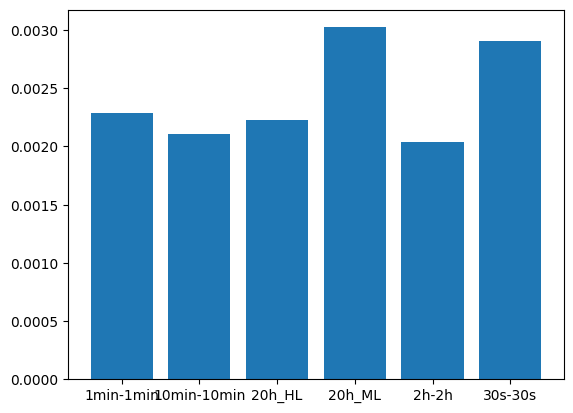

In [21]:
plot_mean_var_per_light_regime(data)

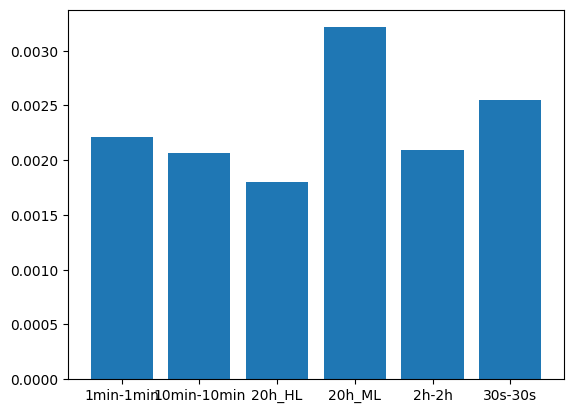

In [22]:
plot_mean_var_per_light_regime(data_norm)

In [23]:
data_norm_WT = data_norm[data_norm['mutant_ID'] == 'WT']

In [24]:
data_WT = data[data['mutant_ID'] == 'WT']

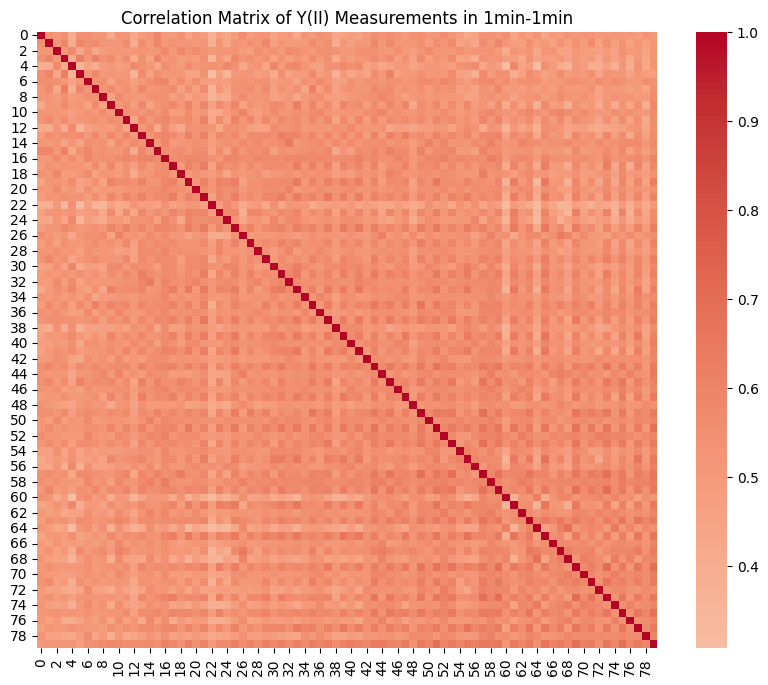

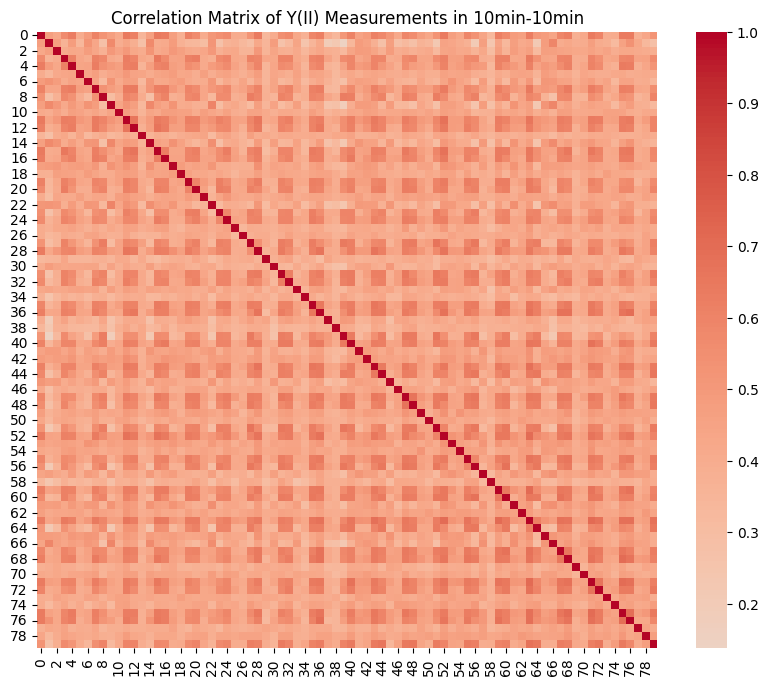

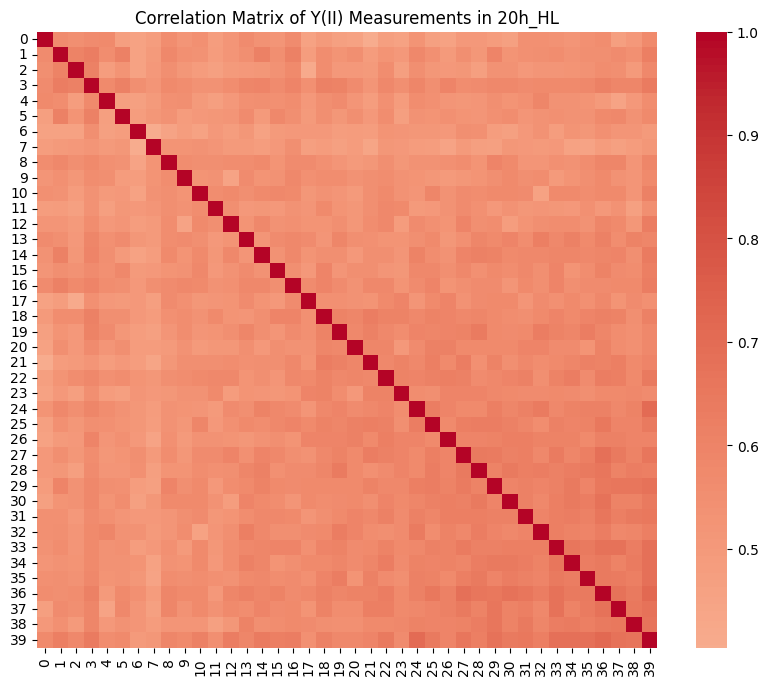

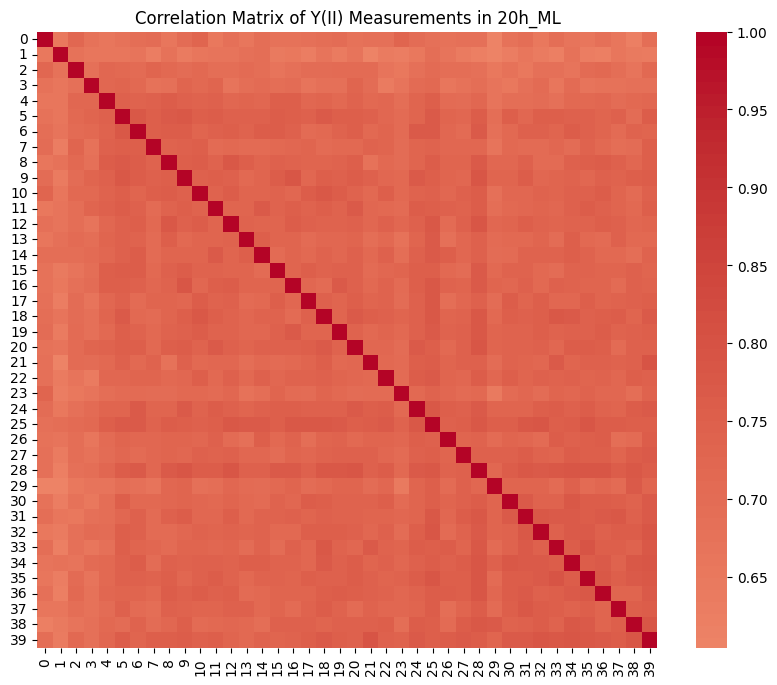

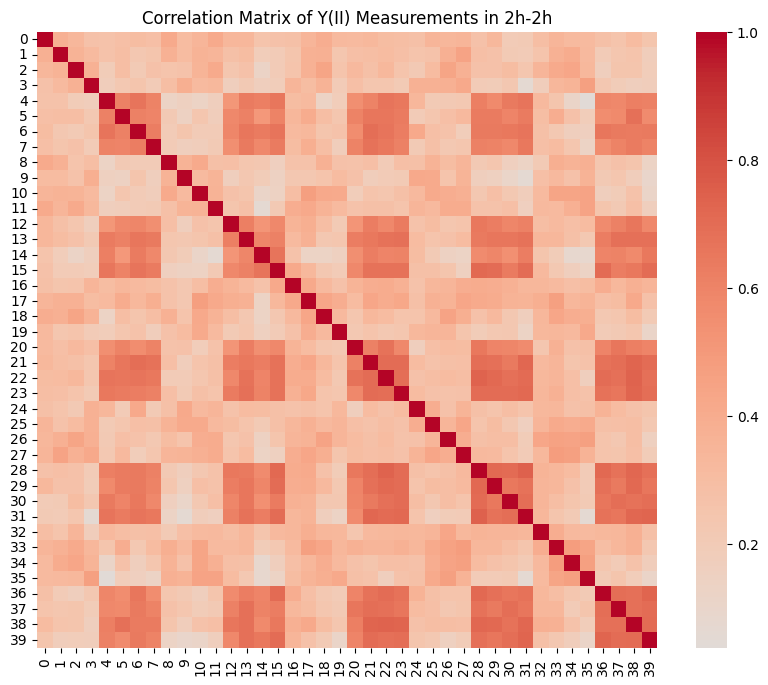

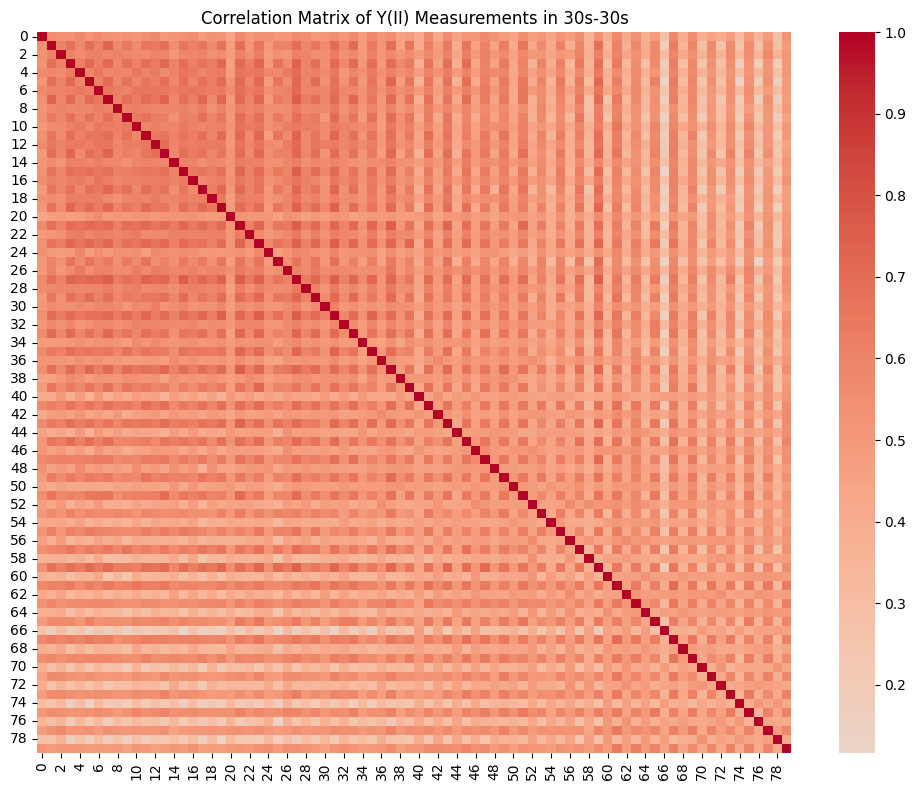

In [25]:
plot_corr_per_light_regime(data_WT)

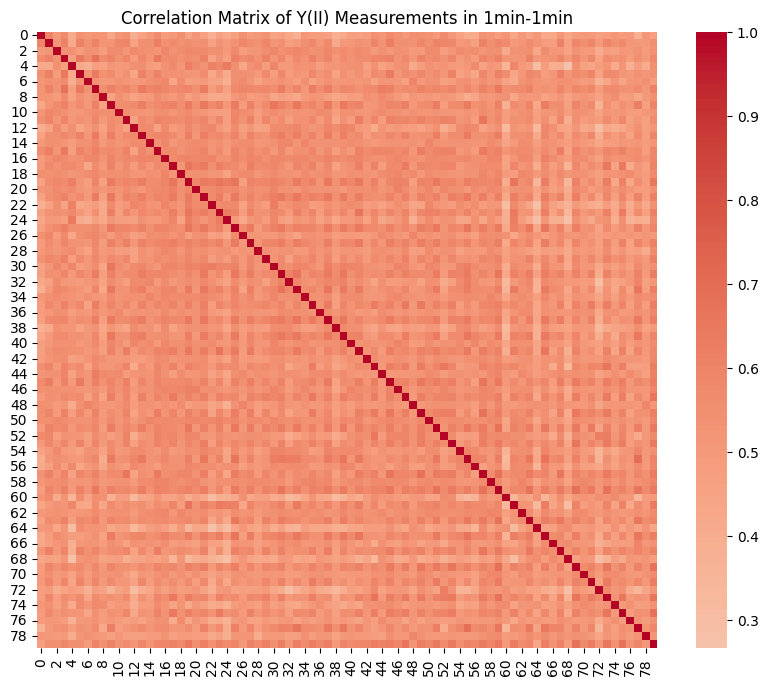

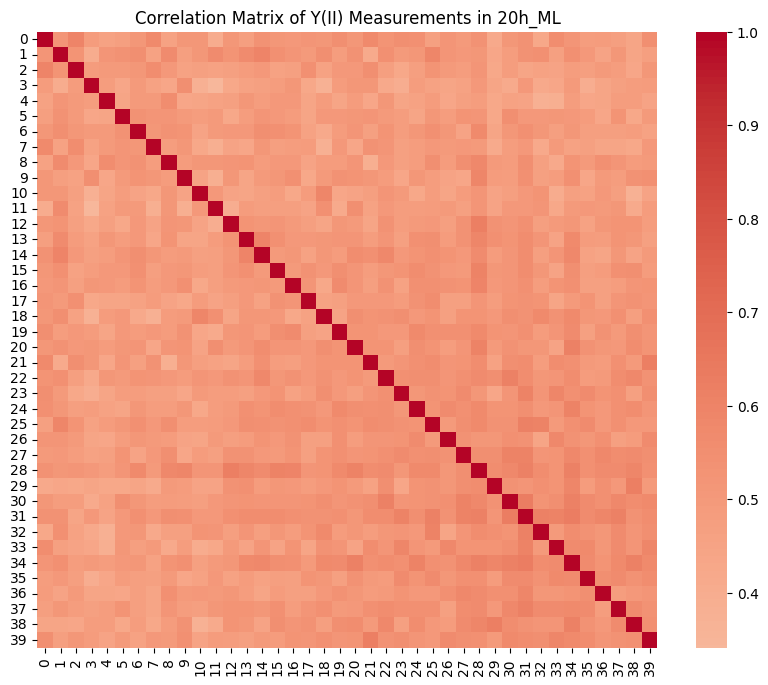

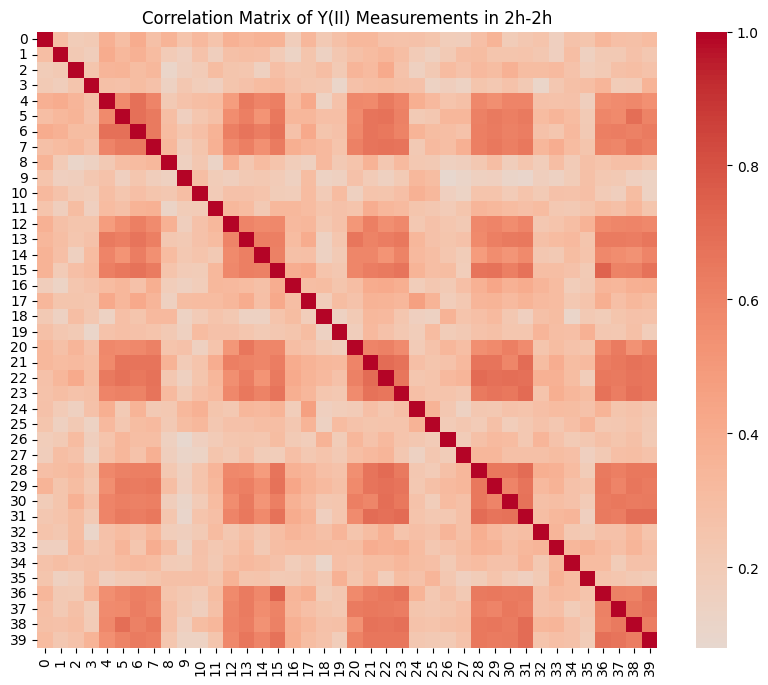

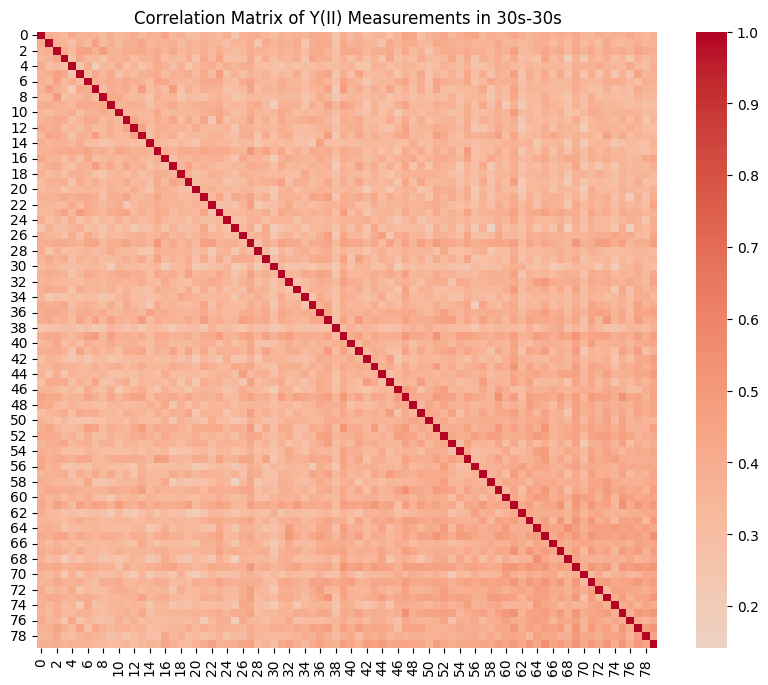

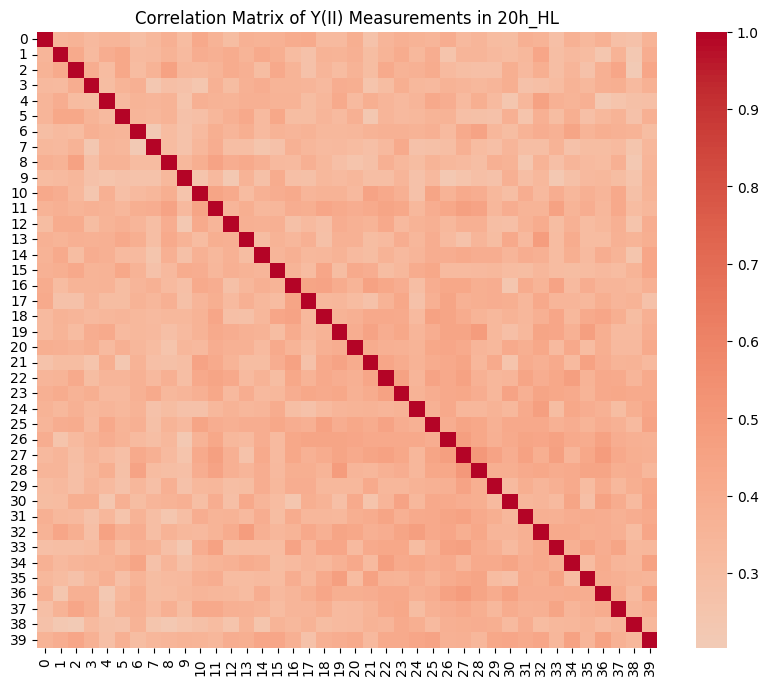

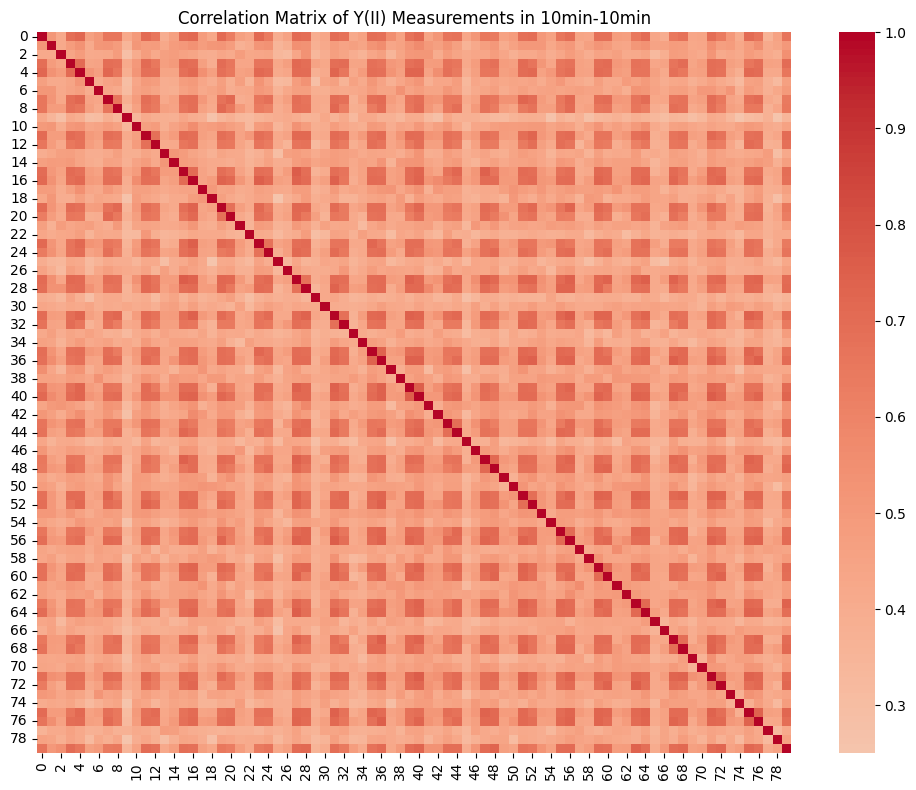

In [ ]:
plot_corr_per_light_regime(data_norm_WT)

In [26]:
data_norm_ML_WT_99 = data_norm_ML[(data_norm_ML['mutant_ID'] == 'WT') & (data_norm_ML['plate'] == 99)]

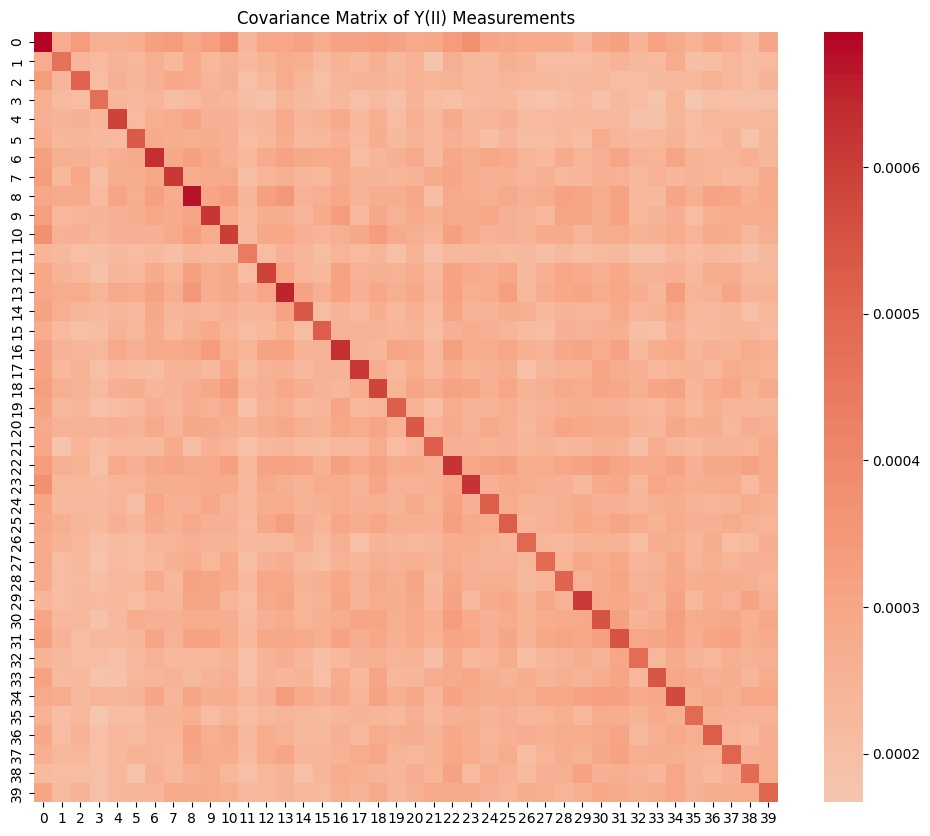

In [27]:
# show the correlation matrix
plot_cov(data_norm_ML_WT_99)

In [28]:
data_norm_WT_99 = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['plate'] == 99)]

In [29]:
data_norm_WT_99_2h = data_norm_WT_99[data_norm_WT_99['light_regime'] == '2h-2h']

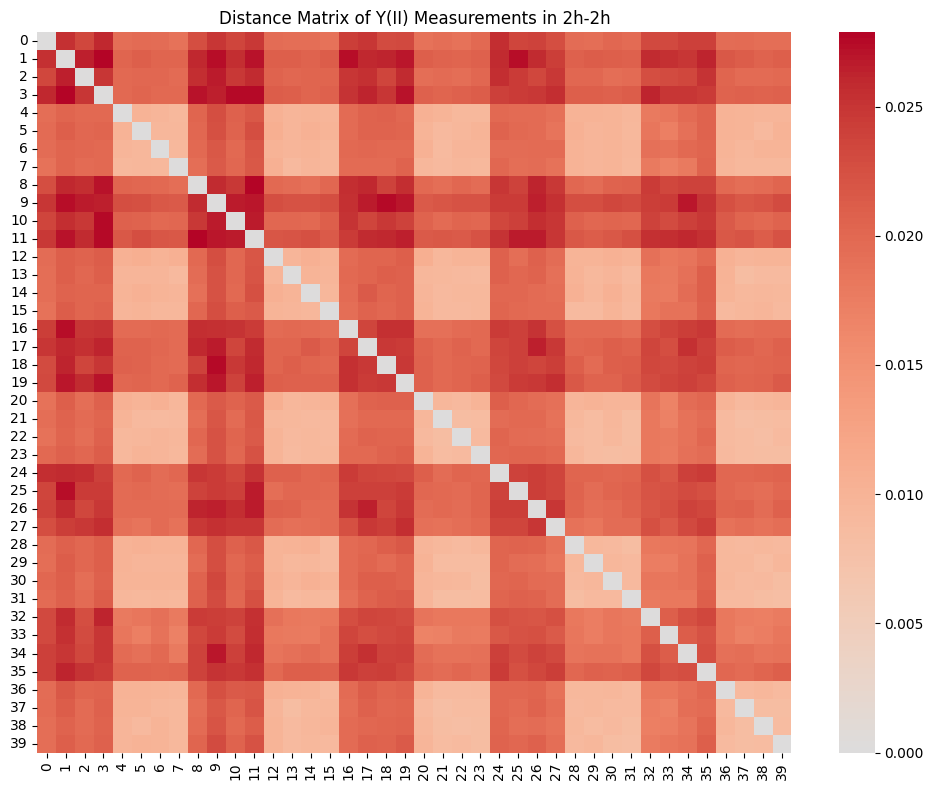

In [30]:
plot_distance_matrix(data_norm_WT_99_2h)

Text(0.5, 1.0, 'Relationship between y2_1 and y2_40')

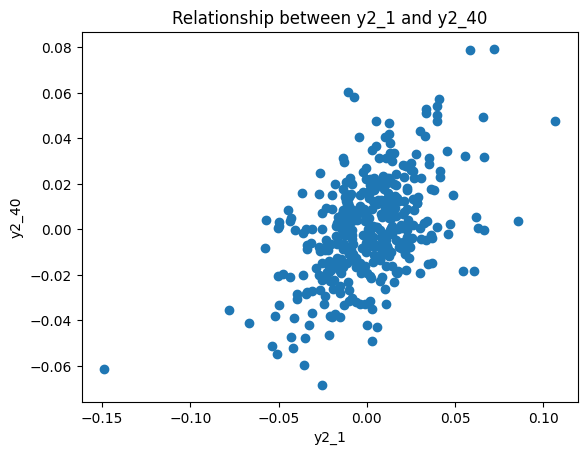

In [32]:
# plot the relationship between y_1 and y_40
plt.scatter(data_norm_ML_WT_99['y2_1'], data_norm_ML_WT_99['y2_40'])
plt.xlabel('y2_1')
plt.ylabel('y2_40')
plt.title('Relationship between y2_1 and y2_40')

(array([ 1.,  1.,  2.,  9., 17., 25., 50., 63., 70., 41., 50., 24., 18.,
         8.,  0.,  1.,  2.,  0.,  0.,  1.]),
 array([-0.05597547, -0.0493668 , -0.04275814, -0.03614947, -0.0295408 ,
        -0.02293214, -0.01632347, -0.00971481, -0.00310614,  0.00350253,
         0.01011119,  0.01671986,  0.02332853,  0.02993719,  0.03654586,
         0.04315453,  0.04976319,  0.05637186,  0.06298053,  0.06958919,
         0.07619786]),
 <BarContainer object of 20 artists>)

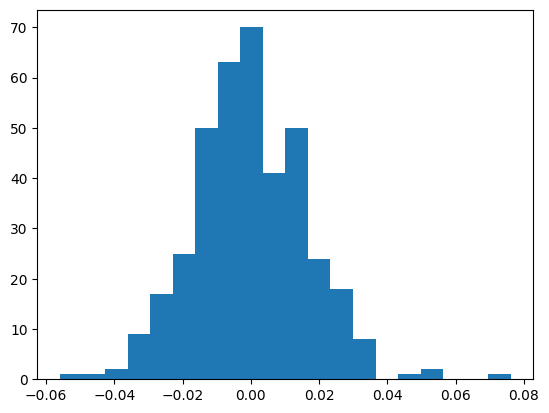

In [33]:
# plot a histogram of mean_y2_norm values for ML
plt.hist(data_norm_ML_WT_99['mean_y2'], bins=20)

In [34]:
data_norm_ML_WT_99 = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['plate'] == 99) & (data_norm['light_regime'] == '2h-2h')]

In [35]:
data_norm_ML_WT_99_y2 = data_norm_ML_WT_99.filter(like='y2_').dropna(axis=1)

In [36]:
# shuffle the columns randomly
data_norm_ML_WT_99_y2_shuffled = data_norm_ML_WT_99_y2.sample(frac=1, axis=1)

Text(0.5, 1.0, 'Lagged Autocorrelation of the y2 values shuffled of the WT in ML light regime for plate 99')

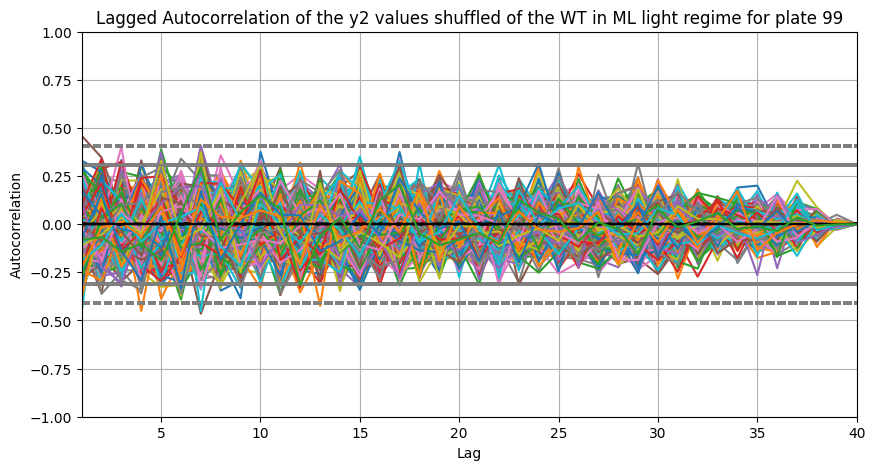

In [37]:
# plot the lagged autocorrelation of the y2 values of the first 10 rows
plt.figure(figsize=(10, 5))
for i in range(len(data_norm_ML_WT_99_y2_shuffled)):
    pd.plotting.autocorrelation_plot(data_norm_ML_WT_99_y2_shuffled.iloc[i])
plt.title('Lagged Autocorrelation of the y2 values shuffled of the WT in ML light regime for plate 99')

Text(0.5, 1.0, 'Lagged Autocorrelation of the y2 values of the WT in ML light regime for plate 99')

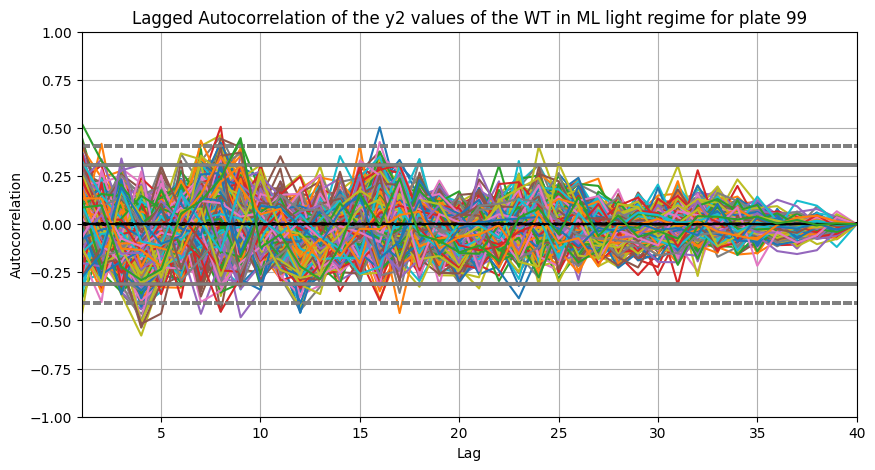

In [38]:
# plot the lagged autocorrelation of the y2 values of the first 10 rows
plt.figure(figsize=(10, 5))
for i in range(len(data_norm_ML_WT_99_y2)):
    pd.plotting.autocorrelation_plot(data_norm_ML_WT_99_y2.iloc[i])
plt.title('Lagged Autocorrelation of the y2 values of the WT in ML light regime for plate 99')

# The gray lines represent the 95% confidence band. The dashed line is the 95% confidence band for the null hypothesis that the data is non-autocorrelated.

Text(0.5, 1.0, 'Average Lagged Autocorrelation of the y2 values of the WT')

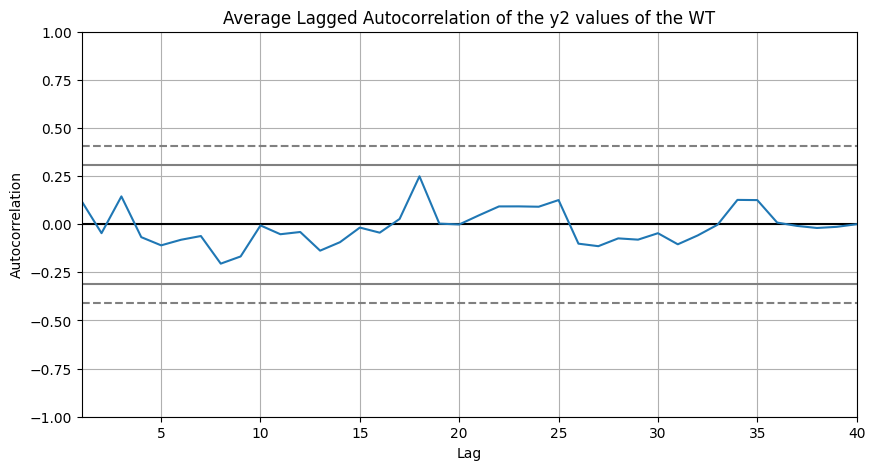

In [39]:
# plot the lagged autocorrelation of the average of y2 values of each row
plt.figure(figsize=(10, 5))
pd.plotting.autocorrelation_plot(data_norm_ML_WT_99_y2.mean())
plt.title('Average Lagged Autocorrelation of the y2 values of the WT')

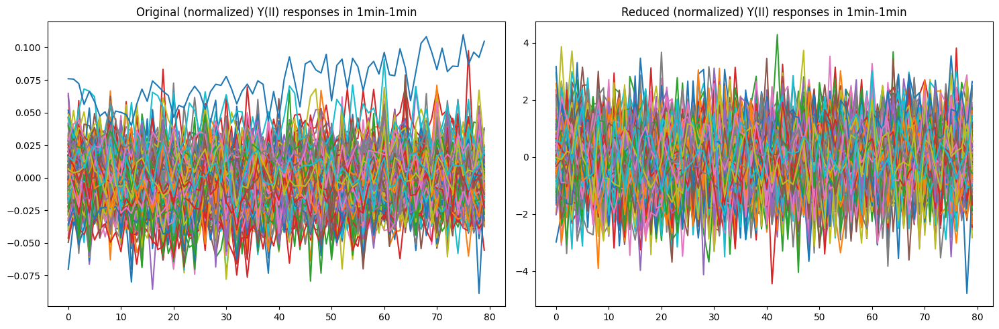

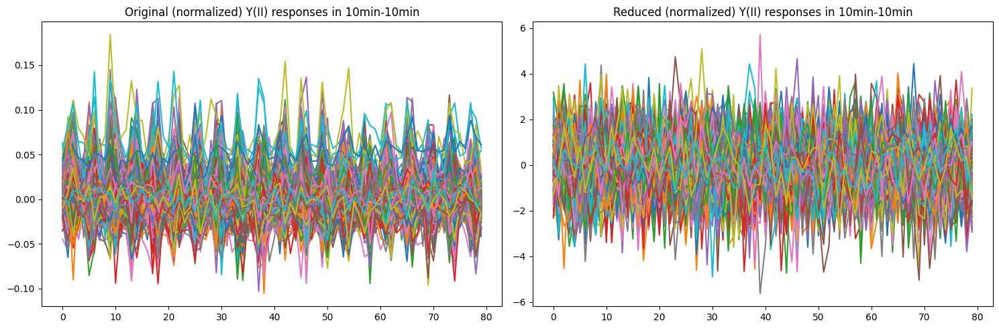

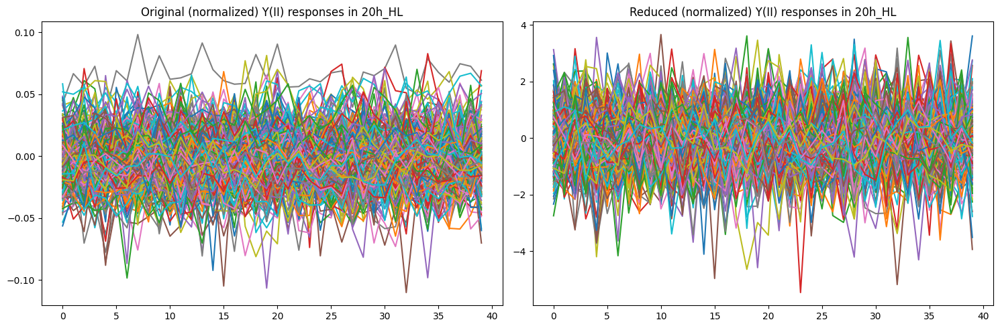

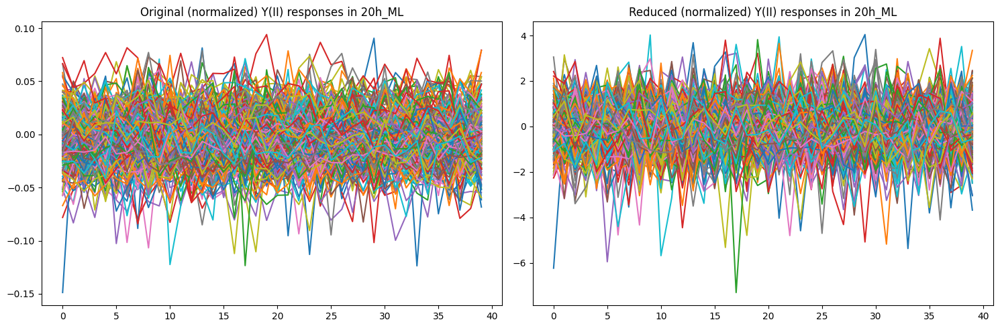

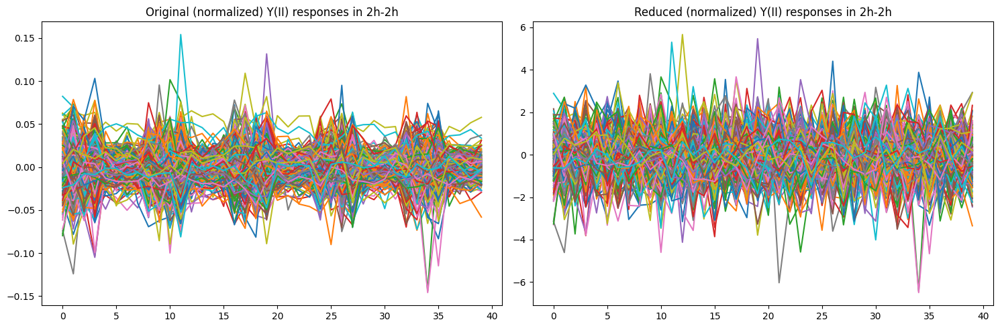

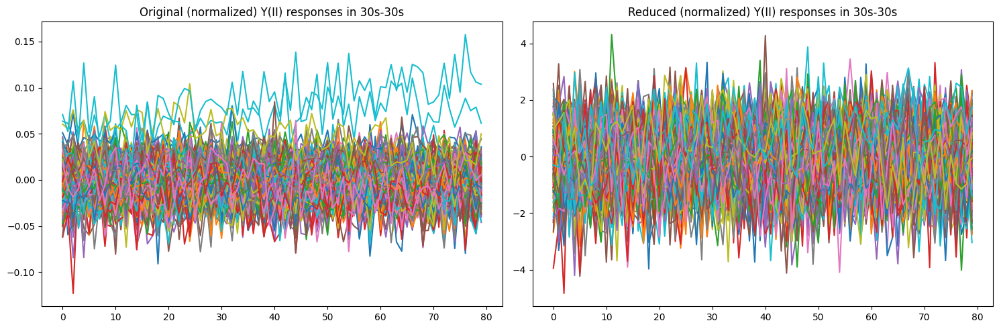

In [40]:
Model_checks.plot_reducted_gaussian_vectors(data_norm_WT)

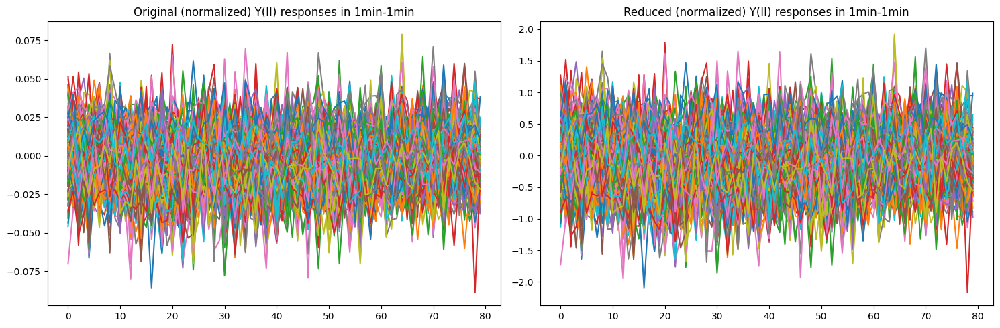

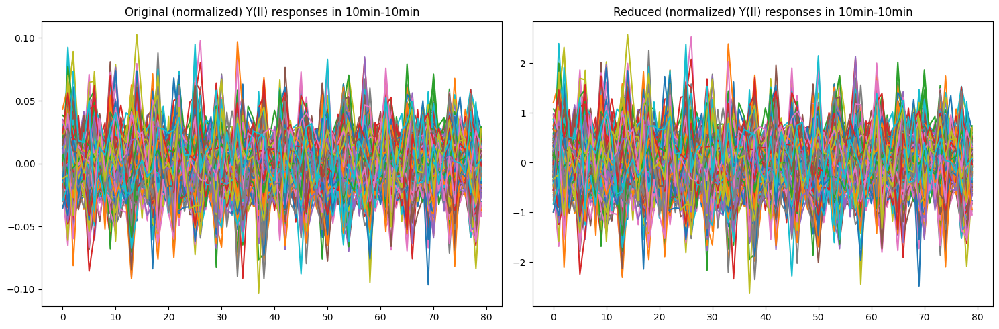

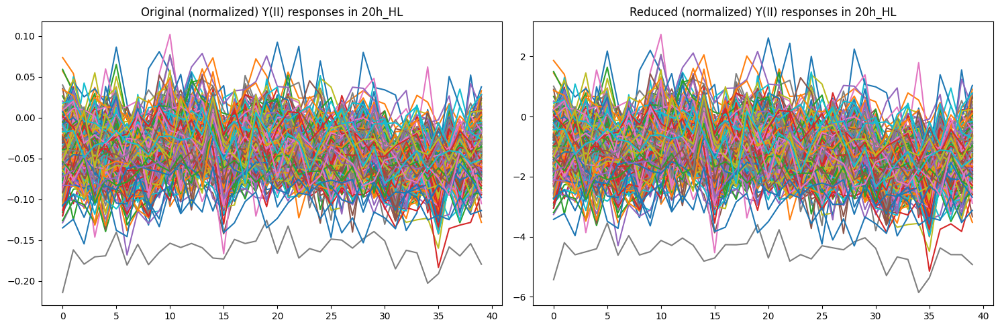

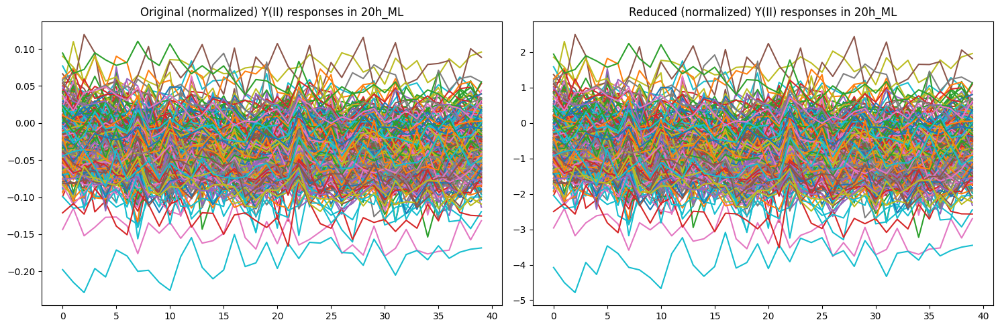

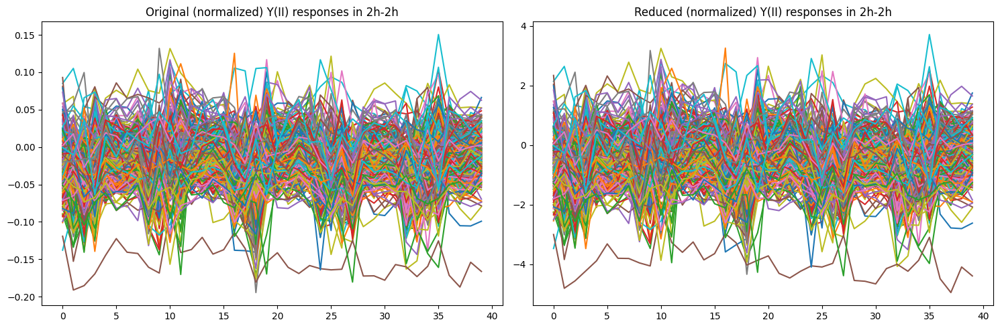

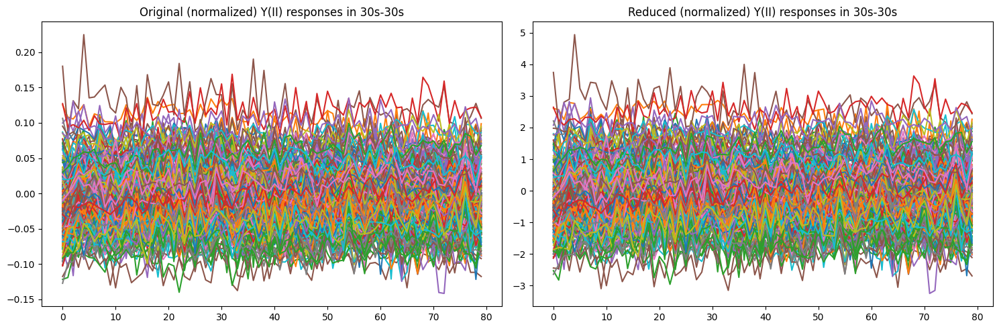

In [41]:
Model_checks.plot_diagonal_reducted_gaussian_vectors(data_norm_ok)